In [1]:
import os, sys
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pathlib import Path
from gofish import imagecube
from ruamel.yaml import YAML

sys.path.insert(0, '../')
import visualization, sensor, grid, line_rte, parametric_disk, inference
from network import shard
from consts import *

from inference import DiskSamplerTurbulence
import emcee

FREQUENCY_SAMPLING_FACTOR = 2
jax.devices()

[CudaDevice(id=0)]

In [2]:
def render_cube(ray_coords, pixel_area, disk, nd_co, temperature, velocity_az, bbox, freqs, nu0):
    ray_coords_sph = grid.cartesian_to_spherical(ray_coords)
    ray_coords_polar = grid.spherical_to_zr(ray_coords_sph)
    
    # Interpolate dataset along the ray coordinates
    gas_nd = grid.interpolate_scalar(nd_co, ray_coords_polar, bbox)
    gas_t  = grid.interpolate_scalar(temperature, ray_coords_polar, bbox, cval=1e-10)
    gas_v_az = grid.interpolate_scalar(velocity_az, ray_coords_polar, bbox)
    gas_v = parametric_disk.azimuthal_velocity(ray_coords, gas_v_az)
    
    # Einstein coefficient for spontaneous emission from level u to level d
    energy_levels, radiative_transitions = line_rte.load_molecular_tables(path=disk.molecule_table)
    _, a_ud, b_ud, b_du = line_rte.einstein_coefficients(energy_levels, radiative_transitions, transition=disk.transition)
    n_up, n_dn = line_rte.n_up_down(gas_nd, gas_t, energy_levels, radiative_transitions, transition=disk.transition)

    alpha_tot = line_rte.alpha_total_co(disk.v_turb, gas_t)

    # print('computing spectral cube for a total of {} frequencies'.format(freqs.size))
    images = line_rte.compute_spectral_cube_pmap(shard(freqs), gas_v, alpha_tot, n_up, n_dn, a_ud, b_ud, b_du, ray_coords, obs_dir, nu0, pixel_area)
    images = np.nan_to_num(images).reshape(freqs.size, *ray_coords.shape[:2])
    return images

In [3]:
# isotope_abundance: 12c16o=1; 13c16o=1/69; 12c18o=1/557
isotope_abundance = 1/69
vlsr = 5770   # m/s
fov_as = 10.0                 # arcsecs
velocity_range = (2000, 10000) # m/s

data_path = '/scratch/ondemand28/len/data/radjax/MAPS/HD_163296_13CO_220GHz.0.2arcsec.image.fits'
data_cube = imagecube(data_path, FOV=fov_as, velocity_range=velocity_range)
print(data_cube.data.shape)
data = data_cube.data
freqs = data_cube.velocity_to_restframe_frequency(vlsr=vlsr)
velocities = data_cube.velax
num_freqs = len(freqs)

num_freqs_resample = num_freqs // FREQUENCY_SAMPLING_FACTOR

idx = np.round(np.linspace(0, num_freqs-1, num_freqs_resample)).astype(int)
# idx = idx[6:8]

data = data_cube.data[idx]
freqs = data_cube.freqax[idx]
velocities = data_cube.velax[idx]


x_sky, y_sky = np.meshgrid(data_cube.xaxis, data_cube.yaxis, indexing='xy')
nu0 = data_cube.nu0
npix = data_cube.nxpix
width_kms = (velocities[-1] - velocities[0]) / 1000.0
delta_v_ms = velocities[1] - velocities[0]


# print(f'num_freqs_resample: {num_freqs_resample}')
print(f'num_freqs: {num_freqs}')
print(f'freqs.shape: {freqs.shape}')
print(f'npix: {npix}')
print('velocity resolution: {} m/s'.format(delta_v_ms))

freqs += nu0 - freqs.mean()

(40, 502, 502)
num_freqs: 40
freqs.shape: (20,)
npix: 502
velocity resolution: 399.9999999943725 m/s


(80, 402, 402)

In [4]:
#
co_abundance = [] # [1e-4 +- ??]
isotope_abundance = [] #[1/1500, 1]

# Fixed Disk Parameters
disk = parametric_disk.DiskFlaherty(
    name='HD163296_CO(2-1)',
    q=-0.27,
    q_in=-0.57,
    r_break=70,
    log_r_c=2.3,
    v_turb=0.06,
    T_atm1=87.0,
    gamma=1.0,
    T_mid1=17.8,
    M_star=2.3*M_sun,
    r_in=11.0,
    M_gas=0.09*M_sun,
    co_abundance=1e-4 * isotope_abundance,
    N_dissoc=0.79*1.59e21,
    N_desorp=-np.inf,
    freezeout=19.0,
    r_scale=150.0,
    z_q0=70.0,
    delta=1,
    transition=2,
    m_mol=2.37*m_h,
    molecule_table='../molecular_tables/molecule_12c16o.inp',
)

resolution = 500
z_min, z_max = 0, 200
r_min, r_max = disk.r_in, 800
z_disk, r_disk = jnp.meshgrid(jnp.linspace(z_min, z_max, resolution), jnp.linspace(r_min, r_max, resolution), indexing='ij')

temperature = disk.temperature_profile(z_disk, r_disk)
nd_h2 = parametric_disk.number_density_profile(z_disk, r_disk, temperature, disk.gamma, disk.r_in, 10**disk.log_r_c, disk.M_gas, disk.M_star, disk.m_mol)
velocity_az = disk.velocity(z_disk, r_disk, nd_h2, temperature)

# Compute the column integrated density N(h2) (units of 1/cm^2)
N_h2 = parametric_disk.surface_density(z_disk, nd_h2)
sigma_h2 = N_h2 * m_h

# Compute the relative abundance of co
abundance_co = disk.co_abundance_profile(N_h2, temperature)
nd_co = abundance_co * nd_h2

2024-12-18 16:07:57.758494: W external/xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version 12.6.77. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [5]:
# Create projection
beam = data_cube.beams_per_pix * sensor.beam(data_cube.dpix, data_cube.bmaj, data_cube.bmin, data_cube.bpa)

projection = sensor.PinholeProjection(
    name=disk.name,
    x_sky=x_sky,
    y_sky=y_sky,
    distance=122.0, 
    nray=100,
    incl=47.5,
    phi=0.0,
    posang=312.0,
    z_width=2*z_max,
    freqs=freqs
)
# Bounding box for interpolations
bbox_disk = jnp.array([(au*z_min, au*z_max), (au*r_min, au*r_max)])

fov_rad =  fov_as*arcsec                                # field of view 
fov = 2 * projection.distance*pc * np.tan(fov_rad/2.0)  # gives ~1708 [au] for 14as
pixel_area = (fov/npix)**2
ray_coords, obs_dir = sensor.pinhole_disk_projection(
    projection.x_sky, projection.y_sky, projection.distance, projection.nray, 
    projection.incl, projection.phi, projection.posang, projection.z_width
)

# Render spectral cube and convolve with gaussian beam
images = render_cube(ray_coords, pixel_area, disk, nd_co, temperature, -velocity_az, bbox_disk, freqs, nu0)
images_blurred = sensor.fftconvolve_vmap(images, beam)

In [31]:
images.shape

(10, 402, 402)

<IPython.core.display.Javascript object>


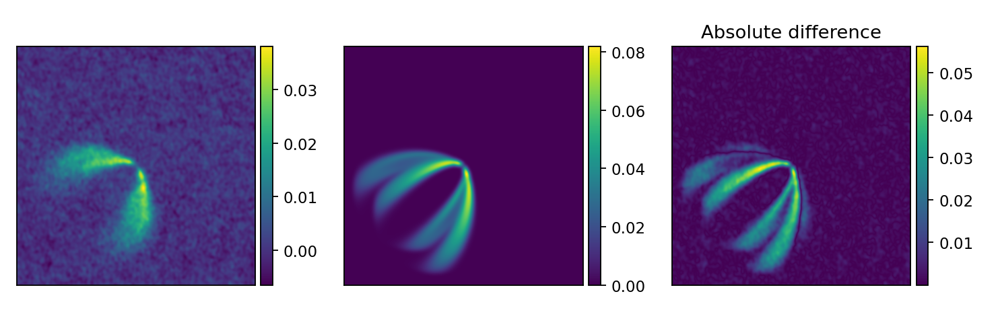

interactive(children=(IntSlider(value=9, description='frame', max=19), Output()), _dom_classes=('widget-intera…

In [6]:
%matplotlib notebook
visualization.slider_frame_comparison(data, images_blurred)

# MCMC estimation

In [7]:
prior = {
    'q': {
        'bounds': [-0.5, 0],
        'p0_range': [-0.4, -0.1],
    },
    'log_r_c': {
        'bounds': [1.75, 2.5],
        'p0_range': [2.0, 2.3],
    },
    'v_turb': {
        'bounds': [0.0, 1.0],
        'p0_range': [0.05, 0.15],
    },
    'T_atm1': {
        'bounds': [40, 150],
        'p0_range': [70, 110],
    },
    'T_mid1': {
        'bounds': [5, 40],
        'p0_range': [15, 25],
    },
    'r_in': {
        'bounds': [1, 20],
        'p0_range': [5, 15],
    },
    'r_break': {
        'bounds': [15, 115],
        'p0_range': [40, 80],
    },
    'q_in': {
        'bounds': [-1, 0],
        'p0_range': [-0.8, -0.2],
    },
}

In [39]:
ray_coords_sph = grid.cartesian_to_spherical(ray_coords)
ray_coords_polar = grid.spherical_to_zr(ray_coords_sph)
energy_levels, radiative_transitions = line_rte.load_molecular_tables(path=disk.molecule_table)

sigma = 0.05 # 5 mJy is ~1% noise level (peak of 0.5Jy)

backend_name = '13co_hires_sampler'
filename = f'{backend_name}.h5'

yaml = YAML(typ='safe')
yaml.default_flow_style = False
# os.makedirs(os.path.dirname(f'{backend_name}_run_params.yaml'), exist_ok=True)
with open(f'{backend_name}_run_params.yaml', 'w') as file:
    yaml.dump(prior, file)
    
disk_sampler = DiskSamplerTurbulence(
    z_disk=z_disk,
    r_disk=r_disk,
    bbox=bbox_disk,
    pixel_area=pixel_area,
    ray_coords=ray_coords,
    ray_coords_polar=ray_coords_polar,
    obs_dir=obs_dir,
    beam=beam,
    energy_levels=energy_levels,
    radiative_transitions=radiative_transitions,
    sigma=sigma,  
    disk=disk,
    params=prior
)

ndim = len(prior)  # Number parameters
nwalkers = 32  # Num walkers
seed = 1234

# initialize positions for all params
p0 = disk_sampler.sample_p0(prior, nwalkers, seed=seed)

setting inital seed to: 1234


In [40]:
backend = emcee.backends.HDFBackend(filename)
backend.reset(nwalkers, ndim)

sampler = emcee.EnsembleSampler(
    nwalkers, ndim, disk_sampler.logprob, args=[data, freqs], backend=backend
)

num_iter = 600
num_iter_restart = 100
restart_cluster_size = 1e-2

run_params = {
    'data_path': data_path,
    'seed': seed,
    'sigma': sigma,
    'nwalkers': nwalkers,
    'num_iter_restart': num_iter_restart,
    'restart_cluster_size': restart_cluster_size
}

with open(f'{backend_name}_run_params.yaml', 'w') as file:
    yaml.dump(run_params, file)

print("Running MCMC...")
# Question: What is this step for?
state = sampler.run_mcmc(p0, num_iter_restart, progress=True)
flat_samples = sampler.get_chain(flat=True)
median = np.median(flat_samples, axis=0)

# run starting from a small cluster around the median
p1 = np.random.normal(median,  restart_cluster_size * np.abs(median), size=(nwalkers, ndim))
state = sampler.run_mcmc(p1, num_iter, progress=True)
####

Running MCMC...


100%|█████████████████████████████████████████████████████████████████████| 600/600 [1:14:41<00:00,  7.47s/it]


<IPython.core.display.Javascript object>


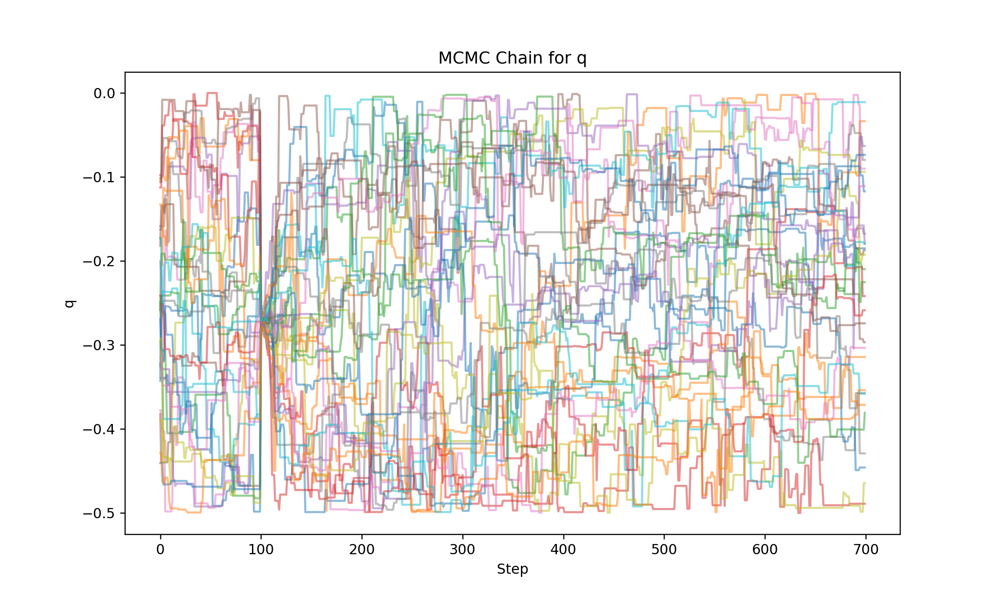

<IPython.core.display.Javascript object>


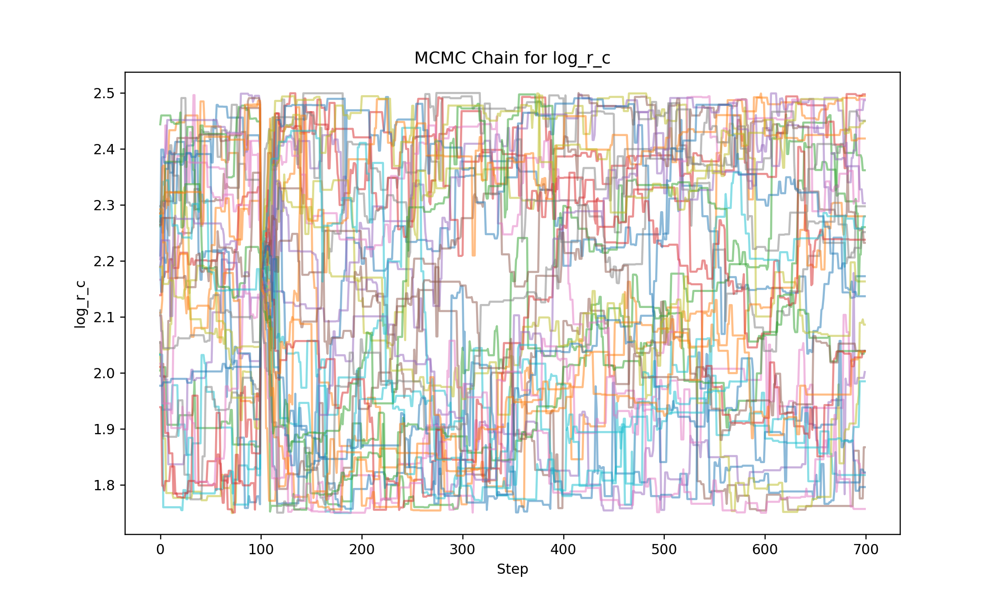

<IPython.core.display.Javascript object>


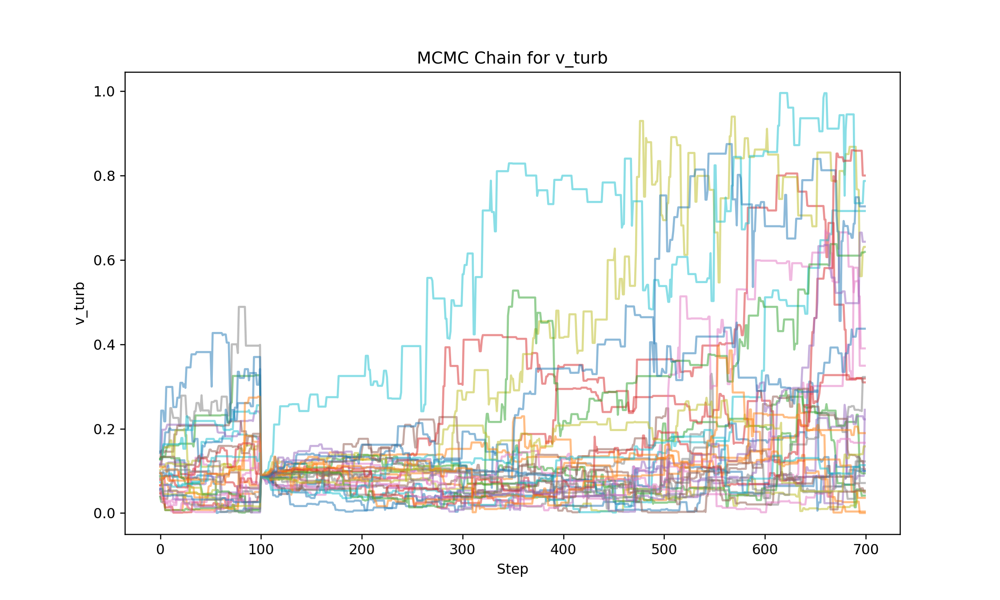

<IPython.core.display.Javascript object>


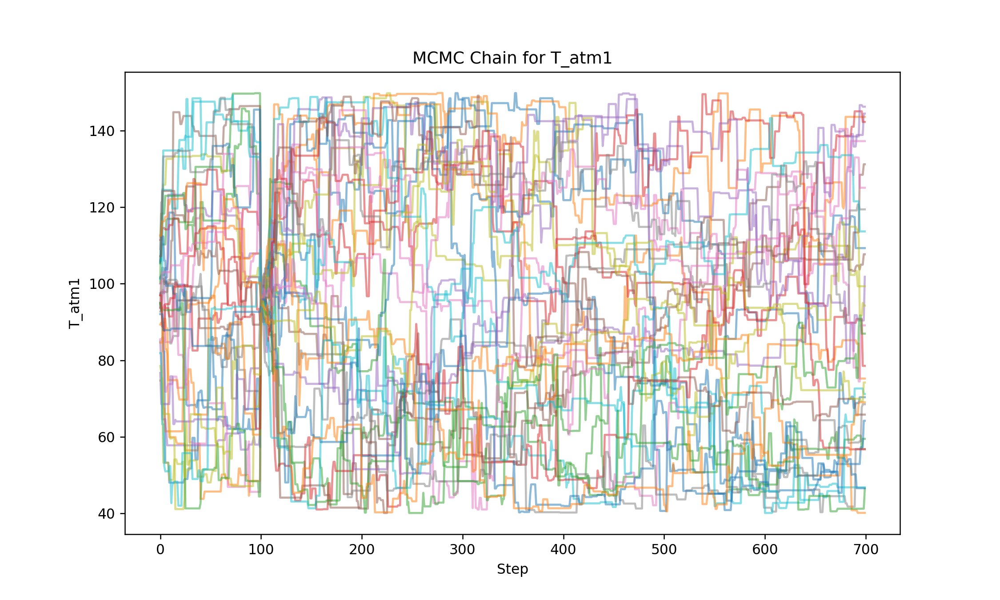

<IPython.core.display.Javascript object>


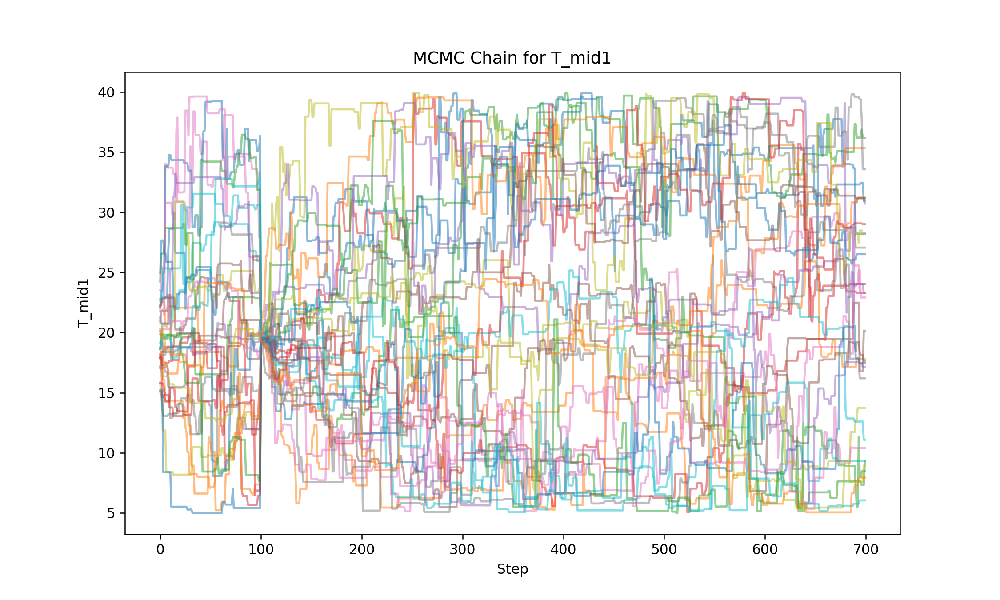

<IPython.core.display.Javascript object>


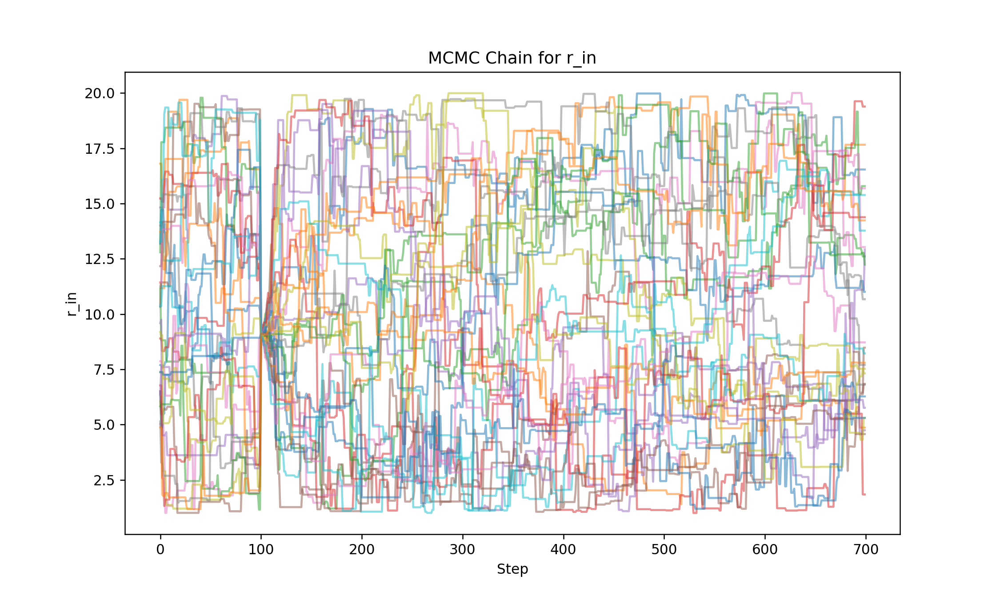

<IPython.core.display.Javascript object>


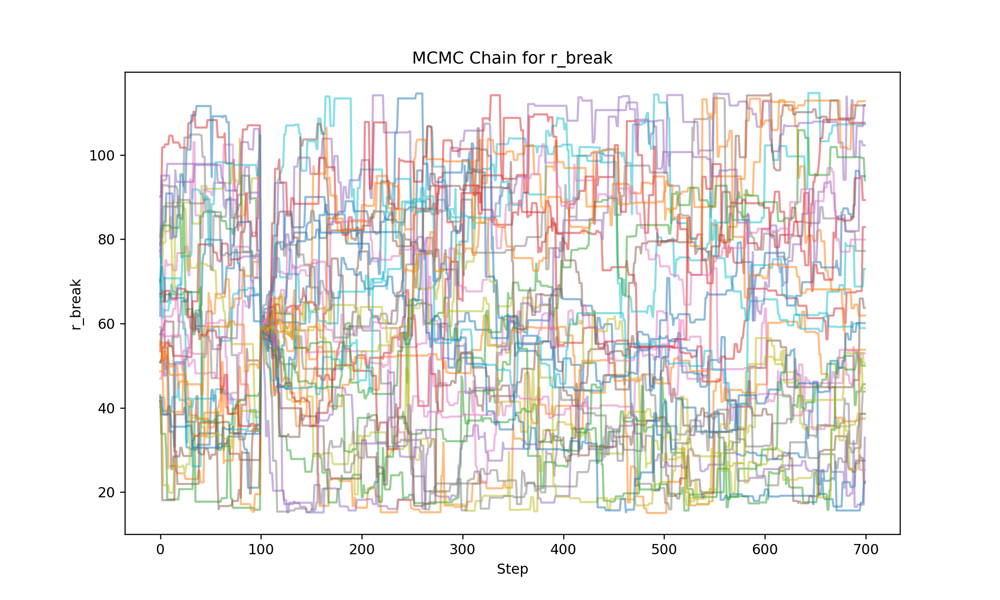

<IPython.core.display.Javascript object>


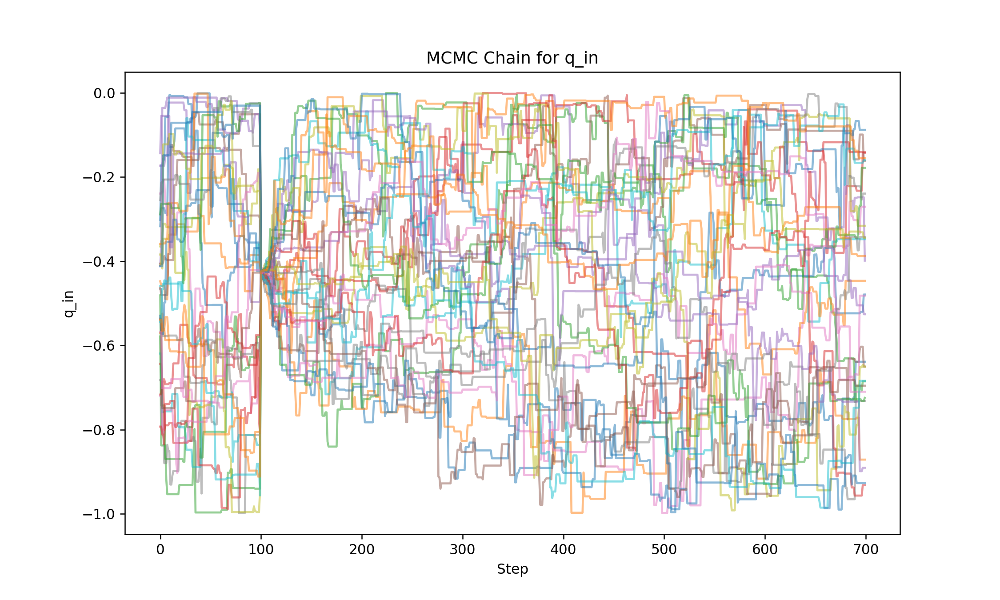

In [42]:
"""
- parameters are stuck or the likelihood is too narrow.
- parameters are exploring too broadly or priors are too weak.
- multiple modes in the posterior?
"""

for i, param_name in enumerate(prior.keys()):
    plt.figure(figsize=(10, 6))
    plt.plot(sampler.get_chain()[:, :, i], alpha=0.5)
    plt.xlabel('Step')
    plt.ylabel(param_name)
    plt.title(f'MCMC Chain for {param_name}')
    plt.show()

In [12]:
import corner
labels = list(prior.keys())
truths = [disk.__dict__[param] for param in labels]  # If you have known true values
fig = corner.corner(samples, labels=labels, truths=truths)
plt.show()

NameError: name 'samples' is not defined

In [13]:
sampler_file = f'{backend_name}.h5'
yaml_file = f'{backend_name}_posterior_params.yaml'
reader = emcee.backends.HDFBackend(sampler_file)

yaml = YAML(typ='safe')
with open(yaml_file, 'r') as stream:
    posterior_params = yaml.load(stream)
param_names = list(prior.keys())

FileNotFoundError: [Errno 2] No such file or directory: '13co_hires_sampler_posterior_params.yaml'

In [14]:
from IPython.display import display, Math

print('Uncertainties based on the 16th, 50th, and 84th percentiles of the samples in the marginalized distributions.')
param_names[1] = 'log(R_c)'
for i in range(ndim):
    mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], param_names[i])
    display(Math(txt))

Uncertainties based on the 16th, 50th, and 84th percentiles of the samples in the marginalized distributions.


NameError: name 'param_names' is not defined